# Hao_PBMC Level 1 ACT annotation result
JobID: 202404300251034ZVD3ZVZT3EB42  
http://xteam.xbio.top/ACT/ResultAction.action?jobID=202404300251034ZVD3ZVZT3EB42

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import os

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
!ls

ACT_Annotation_L1_v1.txt        ACT_marker_genes.ipynb
ACT_Annotation_L1_v2.txt        marker_list
ACT_annotation_L1_UMAP.ipynb    query.ipynb
ACT_annotation_L1_UMAP_v2.ipynb query_v2.ipynb


In [3]:
annot = pd.read_csv('ACT_Annotation_L1_v2.txt', index_col=0, sep='\t')

In [4]:
annot = annot.rename(columns={'whg.overlap': 'canonical.marker.overlap', 'gsea.overlap': 'gsea.DEG.overlap'})
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap
Order,,,,,,,,,
1,B,B cell,4.904815e-37,1.635425e-37,0.000137,6/169,8/264,"CD79A,MS4A1,IGKC,HLA-DRA,CD74,IGHM","CD79A,MS4A1,IGKC,HLA-DRA,CD74,IGHM,B2M,MALAT1"
2,B,Plasma cell,4.068653e-24,6.505119e-27,0.084555,4/64,5/333,"CD79A,MS4A1,IGKC,IGHM","CD79A,IGKC,CD74,IGHM,B2M"
3,B,Memory B cell,6.670259e-19,1.388608e-21,0.162901,5/39,6/44,"MS4A1,HLA-DRA,CD74,IGHM,S100A4","CD79A,MS4A1,IGKC,HLA-DRA,CD74,IGHM"
4,B,Granulocyte,3.659255e-16,7.886324e-18,NaN,6/69,1/40,"CD79A,MS4A1,IGKC,HLA-DRA,CD74,IGHM",HLA-DRA
5,B,Immature B cell,8.157111e-15,6.964723e-16,0.008694,2/5,5/119,"CD79A,MS4A1","CD79A,MS4A1,HLA-DRA,CD74,IGHM"
6,B,Pro-B cell,8.157111e-15,2.131884e-16,NaN,5/17,4/73,"CD79A,MS4A1,HLA-DRA,CD74,IGHM","CD79A,HLA-DRA,CD74,IGHM"
7,B,Naive B cell,4.745981e-14,1.280196e-16,0.330306,2/22,6/66,"MS4A1,IGHM","CD79A,MS4A1,IGKC,HLA-DRA,CD74,IGHM"
8,B,Dendritic cell,1.963016e-09,7.153673e-11,0.042999,3/143,6/307,"IGKC,HLA-DRA,CD74","HLA-DRA,CD74,TMSB4X,B2M,ACTB,S100A4"
9,B,Plasmacytoid dendritic cell,5.801955e-09,3.001011e-10,NaN,5/93,4/295,"CD79A,MS4A1,IGKC,HLA-DRA,CD74","IGKC,HLA-DRA,CD74,IGHM"


In [5]:
annot['canonical.marker.overlap'] = annot['canonical.marker.overlap'].str.split(',').fillna('')
annot['gsea.DEG.overlap'] = annot['gsea.DEG.overlap'].str.split(',').fillna('')

In [6]:
annot['union'] = annot.apply(lambda row: list(set(row['canonical.marker.overlap']) | set(row['gsea.DEG.overlap'])), axis=1)
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,B,B cell,4.904815e-37,1.635425e-37,0.000137,6/169,8/264,"[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]","[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM, B2M,...","[IGKC, MALAT1, MS4A1, CD74, CD79A, B2M, HLA-DR..."
2,B,Plasma cell,4.068653e-24,6.505119e-27,0.084555,4/64,5/333,"[CD79A, MS4A1, IGKC, IGHM]","[CD79A, IGKC, CD74, IGHM, B2M]","[IGKC, MS4A1, CD74, CD79A, B2M, IGHM]"
3,B,Memory B cell,6.670259e-19,1.388608e-21,0.162901,5/39,6/44,"[MS4A1, HLA-DRA, CD74, IGHM, S100A4]","[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]","[IGKC, MS4A1, CD74, CD79A, S100A4, HLA-DRA, IGHM]"
4,B,Granulocyte,3.659255e-16,7.886324e-18,NaN,6/69,1/40,"[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]",[HLA-DRA],"[IGKC, HLA-DRA, MS4A1, CD74, CD79A, IGHM]"
5,B,Immature B cell,8.157111e-15,6.964723e-16,0.008694,2/5,5/119,"[CD79A, MS4A1]","[CD79A, MS4A1, HLA-DRA, CD74, IGHM]","[HLA-DRA, MS4A1, CD74, CD79A, IGHM]"
6,B,Pro-B cell,8.157111e-15,2.131884e-16,NaN,5/17,4/73,"[CD79A, MS4A1, HLA-DRA, CD74, IGHM]","[CD79A, HLA-DRA, CD74, IGHM]","[MS4A1, CD74, CD79A, HLA-DRA, IGHM]"
7,B,Naive B cell,4.745981e-14,1.280196e-16,0.330306,2/22,6/66,"[MS4A1, IGHM]","[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]","[IGKC, MS4A1, CD74, CD79A, HLA-DRA, IGHM]"
8,B,Dendritic cell,1.963016e-09,7.153673e-11,0.042999,3/143,6/307,"[IGKC, HLA-DRA, CD74]","[HLA-DRA, CD74, TMSB4X, B2M, ACTB, S100A4]","[IGKC, CD74, TMSB4X, ACTB, B2M, S100A4, HLA-DRA]"
9,B,Plasmacytoid dendritic cell,5.801955e-09,3.001011e-10,NaN,5/93,4/295,"[CD79A, MS4A1, IGKC, HLA-DRA, CD74]","[IGKC, HLA-DRA, CD74, IGHM]","[IGKC, MS4A1, CD74, CD79A, HLA-DRA, IGHM]"


## Plot UMAP for marker genes (intersection with PreLect)

In [7]:
adata = sc.read_h5ad('/Users/evanli/Documents/Research_datasets/PBMC_Hao/GSE164378_Hao/batch_corrected/Hao_PBMC_Harmony_unscaled.h5ad')
adata.obs['celltype.l1'] = adata.obs['celltype.l1'].str.replace(' ', '_')
labels = adata.obs['celltype.l1']
types = np.unique(labels).tolist()
types

['B', 'CD4_T', 'CD8_T', 'DC', 'Mono', 'NK', 'other', 'other_T']

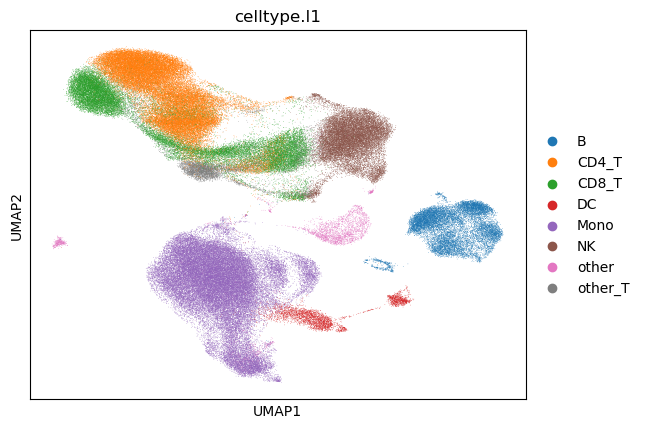

In [8]:
# UMAP embedding in adata
sc.pl.umap(adata, color=['celltype.l1'], legend_loc="right margin")

## B

In [10]:
annot[annot['Cluster'] == 'B']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,B,B cell,4.904815e-37,1.635425e-37,0.000137,6/169,8/264,"[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]","[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM, B2M,...","[IGKC, MALAT1, MS4A1, CD74, CD79A, B2M, HLA-DR..."
2,B,Plasma cell,4.068653e-24,6.505119e-27,0.084555,4/64,5/333,"[CD79A, MS4A1, IGKC, IGHM]","[CD79A, IGKC, CD74, IGHM, B2M]","[IGKC, MS4A1, CD74, CD79A, B2M, IGHM]"
3,B,Memory B cell,6.670259e-19,1.388608e-21,0.162901,5/39,6/44,"[MS4A1, HLA-DRA, CD74, IGHM, S100A4]","[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]","[IGKC, MS4A1, CD74, CD79A, S100A4, HLA-DRA, IGHM]"
4,B,Granulocyte,3.659255e-16,7.886324e-18,NaN,6/69,1/40,"[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]",[HLA-DRA],"[IGKC, HLA-DRA, MS4A1, CD74, CD79A, IGHM]"
5,B,Immature B cell,8.157111e-15,6.964723e-16,0.008694,2/5,5/119,"[CD79A, MS4A1]","[CD79A, MS4A1, HLA-DRA, CD74, IGHM]","[HLA-DRA, MS4A1, CD74, CD79A, IGHM]"
6,B,Pro-B cell,8.157111e-15,2.131884e-16,NaN,5/17,4/73,"[CD79A, MS4A1, HLA-DRA, CD74, IGHM]","[CD79A, HLA-DRA, CD74, IGHM]","[MS4A1, CD74, CD79A, HLA-DRA, IGHM]"
7,B,Naive B cell,4.745981e-14,1.280196e-16,0.330306,2/22,6/66,"[MS4A1, IGHM]","[CD79A, MS4A1, IGKC, HLA-DRA, CD74, IGHM]","[IGKC, MS4A1, CD74, CD79A, HLA-DRA, IGHM]"
8,B,Dendritic cell,1.963016e-09,7.153673e-11,0.042999,3/143,6/307,"[IGKC, HLA-DRA, CD74]","[HLA-DRA, CD74, TMSB4X, B2M, ACTB, S100A4]","[IGKC, CD74, TMSB4X, ACTB, B2M, S100A4, HLA-DRA]"
9,B,Plasmacytoid dendritic cell,5.801955e-09,3.001011e-10,NaN,5/93,4/295,"[CD79A, MS4A1, IGKC, HLA-DRA, CD74]","[IGKC, HLA-DRA, CD74, IGHM]","[IGKC, MS4A1, CD74, CD79A, HLA-DRA, IGHM]"


In [11]:
B_canon = annot[(annot['Cluster']=='B') & (annot['Cell.Type']=='B cell')]['canonical.marker.overlap'].tolist()[0]
B_canon

['CD79A', 'MS4A1', 'IGKC', 'HLA-DRA', 'CD74', 'IGHM']

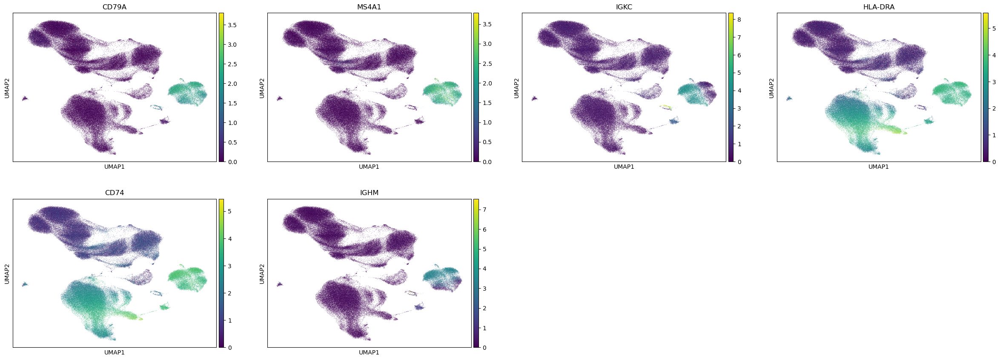

In [12]:
sc.pl.umap(adata, color=B_canon)

## CD4 T

In [13]:
annot[annot['Cluster']=='CD4_T']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,CD4_T,"Central memory CD4-positive, alpha-beta T cell",2.434077e-33,1.035777e-34,NaN,8/25,0/1,"[CD4, TMSB10, IL7R, TRAC, MAL, IL32, LTB, ITGB1]",,"[TMSB10, LTB, IL7R, IL32, ITGB1, CD4, MAL, TRAC]"
2,CD4_T,"CD4-positive, alpha-beta T cell",4.261216e-29,1.054651e-27,0.000035,7/93,23/281,"[CD4, CD40LG, CD2, TRBC1, IL7R, TRAC, LTB]","[CD4, CD40LG, TRAT1, ITM2A, CD52, CD2, TRBC1, ...","[RORA, CD40LG, IL6ST, MAL, CD2, IL7R, S100A4, ..."
3,CD4_T,Helper T cell,5.020626e-27,5.895022e-29,0.106212,6/57,21/159,"[CD4, CD40LG, CD52, IL7R, TRBC2, IL32]","[CD4, CD40LG, TRAT1, ITM2A, CD52, CD2, TRBC1, ...","[RORA, CD40LG, CD2, IL7R, S100A4, IL32, CD4, I..."
4,CD4_T,Regulatory T cell,6.955076e-26,1.003091e-25,0.001129,8/68,9/98,"[CD4, CD40LG, CD52, TRBC1, IL7R, TRAC, TRBC2, ...","[CD2, TRBC1, CORO1B, TRAC, TRBC2, IL32, LTB, S...","[CD40LG, CD2, LTB, CD52, IL7R, CD247, S100A4, ..."
5,CD4_T,"Activated CD4-positive, alpha-beta T cell",4.001967e-20,1.730498e-18,0.000057,4/30,19/430,"[CD4, IL7R, LTB, ITGB1]","[CD40LG, TRAT1, ITM2A, CD52, CD2, CD6, IL7R, T...","[RORA, CD40LG, CD2, IL7R, S100A4, IL32, ITGB1,..."
6,CD4_T,"Effector memory CD4-positive, alpha-beta T cell",6.112483e-19,9.103698e-20,NaN,5/26,0/1,"[CD4, IL7R, MAL, RORA, ITGB1]",,"[RORA, ITGB1, CD4, MAL, IL7R]"
7,CD4_T,"CD8-positive, alpha-beta T cell",5.601672e-16,9.602474e-14,0.000024,8/96,14/293,"[CD4, CD2, TRBC1, IL7R, TRAC, TRBC2, LTB, ITGB1]","[ITM2A, CD52, CD2, TRBC1, IL7R, TRAC, CD3G, GI...","[RORA, CD2, IL7R, S100A4, IL32, ITGB1, CD4, LT..."
8,CD4_T,T-helper 17 cell,6.506509e-16,1.245927e-16,NaN,3/31,0/1,"[CD4, IL7R, RORA]",,"[RORA, IL7R, CD4]"
9,CD4_T,Induced T-regulatory cell,7.552885e-16,1.606997e-16,NaN,2/4,0/1,"[CD4, IL7R]",,"[IL7R, CD4]"


['CD4', 'CD40LG', 'CD2', 'TRBC1', 'IL7R', 'TRAC', 'LTB']


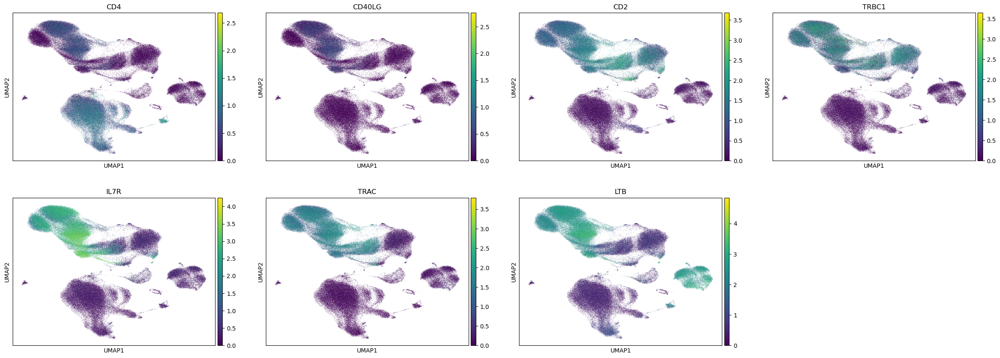

In [31]:
cd4_T_canon = annot[(annot['Cluster']=='CD4_T') & (annot['Cell.Type']=='CD4-positive, alpha-beta T cell')]['canonical.marker.overlap'].tolist()[0]
print(cd4_T_canon)
sc.pl.umap(adata, color=cd4_T_canon)

## CD8 T

In [15]:
annot[annot['Cluster']=='CD8_T']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,CD8_T,"Effector memory CD8-positive, alpha-beta T cell",1.716411e-36,1.777433e-37,0.002240,6/44,5/78,"[CD8B, CD8A, TRAC, CCL5, TMSB4X, CD74]","[CD8B, CD8A, CCL5, B2M, S100A4]","[CD74, TMSB4X, CD8B, CCL5, S100A4, B2M, CD8A, ..."
2,CD8_T,T cell,5.181170e-36,6.983956e-35,0.000035,8/221,14/225,"[CD8B, CD8A, TRAC, CCL5, FTH1, ACTB, MALAT1, LTB]","[CD8B, CD8A, CD3D, TRAC, CD3G, CD3E, CCL5, PTM...","[MALAT1, FTH1, TMSB4X, CD8B, CD3D, B2M, S100A4..."
3,CD8_T,"CD8-positive, alpha-beta T cell",3.474623e-33,1.039732e-32,0.000257,5/96,13/293,"[CD8B, CD8A, TRAC, CCL5, LTB]","[CD8B, CD8A, CD3D, TRAC, CD3G, CD3E, CCL5, B2M...","[MALAT1, TMSB4X, CD8B, CD3D, B2M, S100A4, LTB,..."
4,CD8_T,"CD8-positive, alpha-beta cytotoxic T cell",1.360052e-22,6.303566e-24,0.031730,3/51,12/175,"[CD8B, CD8A, CCL5]","[CD8B, CD8A, CD3D, TRAC, CD3G, CD3E, CCL5, B2M...","[MALAT1, CD74, CD3G, CCL5, CD8B, CD3D, ARL4C, ..."
5,CD8_T,"Naive thymus-derived CD8-positive, alpha-beta ...",1.173194e-21,1.844132e-23,0.122051,2/13,11/179,"[CD8B, CD8A]","[CD8B, CD8A, CD3D, CD3G, CD3E, CCL5, ACTB, S10...","[CD3G, CD8B, CD3D, CCL5, MT-CO1, ACTB, S100A4,..."
6,CD8_T,"Central memory CD8-positive, alpha-beta T cell",3.487331e-18,2.553573e-19,0.037009,2/9,5/40,"[CD8B, CD8A]","[CD8B, CD8A, CCL5, B2M, CD74]","[CCL5, B2M, CD8A, CD74, CD8B]"
7,CD8_T,"Double-positive, alpha-beta thymocyte",6.175503e-18,9.197558e-19,NaN,2/5,0/1,"[CD8B, CD8A]",,"[CD8B, CD8A]"
8,CD8_T,Mature NK T cell,4.367941e-17,2.508290e-18,0.067016,3/39,9/141,"[CD8B, CD8A, CCL5]","[CD3D, TRAC, CD3G, CD3E, CCL5, ACTB, MALAT1, A...","[MALAT1, CD3G, CCL5, CD8B, CD3D, ARL4C, ACTB, ..."
9,CD8_T,"Effector CD8-positive, alpha-beta T cell",7.972722e-14,1.526692e-14,NaN,2/8,0/1,"[CD8B, CD8A]",,"[CD8B, CD8A]"


['CD8B', 'CD8A', 'TRAC', 'CCL5', 'LTB']


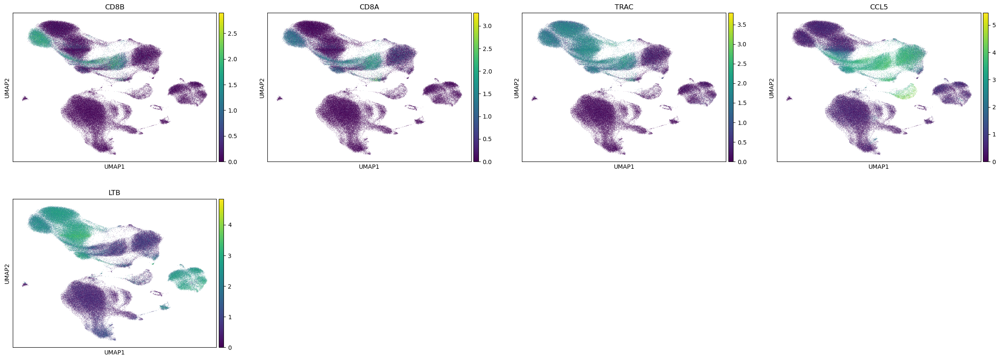

In [32]:
name = 'Effector memory CD8-positive, alpha-beta T cell'
name = 'CD8-positive, alpha-beta T cell'
CD8_Tem_canon = annot[(annot['Cluster']=='CD8_T') & (annot['Cell.Type']==name)]['canonical.marker.overlap'].tolist()[0]
print(CD8_Tem_canon)
sc.pl.umap(adata, color=CD8_Tem_canon)

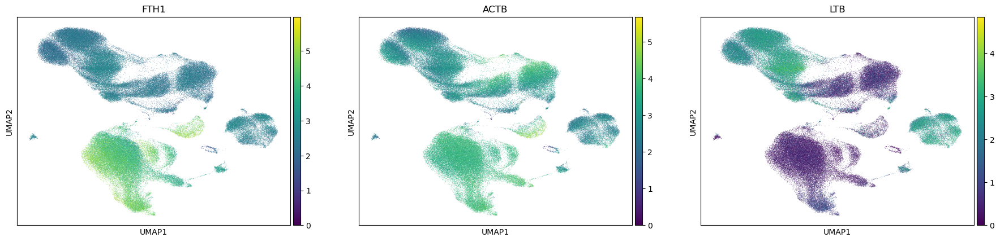

In [18]:
T_canon = ['FTH1', 'ACTB', 'LTB']
sc.pl.umap(adata, color=T_canon)

## DC

In [19]:
annot[annot['Cluster']=='DC']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,DC,Dendritic cell,1.480016e-48,5.499618e-50,0.000956,11/143,17/307,"[CST3, FCER1A, HLA-DQA1, HLA-DPB1, PLD4, HLA-D...","[CST3, FCER1A, PPP1R14B, HLA-DQA1, HLA-DPB1, P...","[FTL, PPP1R14B, B2M, HLA-DQA1, HLA-DRA, TXN, H..."
2,DC,Macrophage,1.187126e-20,4.952408e-23,0.037131,14/281,20/653,"[CST3, HLA-DQA1, HLA-DPB1, HLA-DPA1, HLA-DRA, ...","[CST3, FCER1A, CCDC88A, HLA-DQA1, HLA-DPB1, PL...","[MT-ND2, FTL, HLA-DQA1, HLA-DRA, HLA-C, SAT1, ..."
3,DC,Monocyte,2.275004e-18,1.446364e-20,0.040775,12/218,15/365,"[CST3, HLA-DQA1, HLA-DPB1, HLA-DPA1, HLA-DRA, ...","[CST3, HLA-DQA1, HLA-DPB1, HLA-DPA1, ARL4C, HL...","[MALAT1, FTL, HLA-DQA1, HLA-DRA, TXN, HLA-C, C..."
4,DC,Conventional dendritic cell,8.976341e-16,1.712013e-17,0.026126,5/22,8/99,"[CST3, FCER1A, HLA-DPB1, HLA-DRA, CD74]","[CST3, HLA-DQA1, HLA-DPB1, HLA-DPA1, HLA-DRA, ...","[SAT1, CD74, TXNIP, HLA-DPA1, HLA-DQA1, HLA-DR..."
5,DC,Myeloid dendritic cell,1.480193e-15,3.828085e-17,NaN,8/63,0/1,"[CST3, FCER1A, HLA-DQA1, HLA-DPB1, PLD4, HLA-D...",,"[PLD4, CD74, HLA-DPA1, HLA-DQA1, HLA-DRA, HLA-..."
6,DC,CD1c-positive myeloid dendritic cell,3.821629e-13,7.054409e-16,0.445424,3/15,7/35,"[CST3, FCER1A, HLA-DRA]","[CST3, FCER1A, HLA-DQA1, HLA-DPB1, HLA-DPA1, H...","[HLA-DPB1, CD74, HLA-DQA1, HLA-DRA, HLA-DPA1, ..."
7,DC,B cell,8.318708e-13,4.834914e-13,0.001659,9/169,14/264,"[CST3, HLA-DQA1, HLA-DPB1, HLA-DPA1, HLA-DRA, ...","[HLA-DQA1, HLA-DPB1, HLA-DPA1, CCDC50, HLA-DRA...","[MALAT1, B2M, HLA-DQA1, HLA-DRA, MT-ND3, HLA-C..."
8,DC,Plasmacytoid dendritic cell,4.502675e-12,6.584751e-14,0.078252,7/93,13/295,"[CST3, FCER1A, PLD4, HLA-DPA1, CCDC50, HLA-DRA...","[PPP1R14B, CCDC88A, HLA-DQA1, HLA-DPB1, PLD4, ...","[SEC61B, PPP1R14B, HLA-DQA1, HLA-DRA, TXN, CST..."
9,DC,"Plasmacytoid dendritic cell, human",1.011086e-10,4.793943e-12,NaN,2/5,0/1,"[PLD4, CCDC50]",,"[PLD4, CCDC50]"


['CST3', 'FCER1A', 'HLA-DQA1', 'HLA-DPB1', 'PLD4', 'HLA-DPA1', 'HLA-DRA', 'TXN', 'CD74', 'FTL', 'CD52']


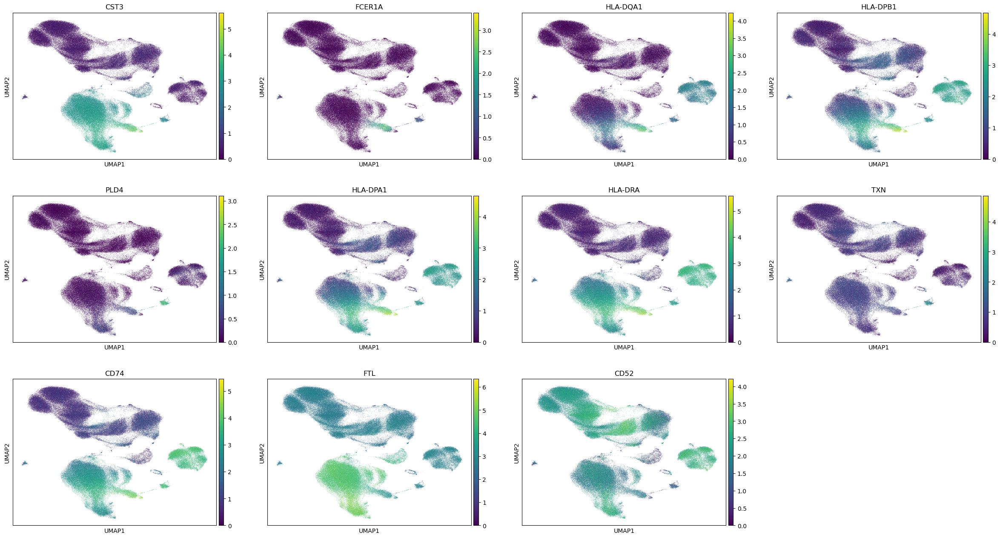

In [20]:
DC_canon = annot[(annot['Cluster']=='DC') & (annot['Cell.Type']=='Dendritic cell')]['canonical.marker.overlap'].tolist()[0]
print(DC_canon)
sc.pl.umap(adata, color=DC_canon)

## Monocyte

In [21]:
annot[annot['Cluster']=='Mono']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Mono,Monocyte,1.217007e-41,1.118845e-42,0.000445,11/218,10/365,"[CTSS, FCN1, AIF1, NEAT1, CFD, S100A9, S100A8,...","[CTSS, FCN1, AIF1, NEAT1, CFD, S100A9, S100A8,...","[MALAT1, AIF1, CTSS, PSAP, LST1, FCN1, SAT1, C..."
2,Mono,Macrophage,1.804149e-18,1.652038e-21,0.186304,12/281,12/653,"[CTSS, FCN1, AIF1, NEAT1, S100A9, S100A8, LST1...","[CTSS, FCN1, AIF1, NEAT1, CFD, S100A9, S100A8,...","[MT-ATP6, RPS27, AIF1, CTSS, PSAP, LST1, B2M, ..."
3,Mono,CD14-positive monocyte,6.227838e-18,1.684249e-20,0.097872,3/25,8/155,"[FCN1, S100A9, S100A8]","[CTSS, FCN1, AIF1, NEAT1, S100A9, S100A8, LST1...","[AIF1, CTSS, PSAP, LST1, S100A8, FCN1, NEAT1, ..."
4,Mono,Classical monocyte,7.342853e-16,1.266009e-17,NaN,4/122,4/66,"[FCN1, NEAT1, S100A9, S100A8]","[CTSS, FCN1, S100A9, S100A8]","[CTSS, S100A8, FCN1, NEAT1, S100A9]"
5,Mono,Suppressor macrophage,3.810078e-11,9.853651e-13,NaN,2/16,0/1,"[S100A9, S100A8]",,"[S100A8, S100A9]"
6,Mono,Neutrophil,1.053794e-09,4.899859e-12,0.227508,2/117,10/280,"[S100A9, S100A8]","[CTSS, FCN1, AIF1, S100A9, S100A8, LST1, RPS27...","[RPS29, RPS3, RPS27, AIF1, CTSS, LST1, S100A9,..."
7,Mono,Inflammatory macrophage,3.011306e-09,2.107815e-09,0.001805,4/69,11/421,"[FCN1, S100A9, S100A8, LST1]","[CTSS, FCN1, AIF1, NEAT1, CFD, S100A9, S100A8,...","[SAT1, CFD, AIF1, CTSS, PSAP, LST1, B2M, S100A..."
8,Mono,Myeloid suppressor cell,1.178005e-08,1.431895e-08,0.001239,3/41,11/446,"[FCN1, S100A9, S100A8]","[CTSS, FCN1, AIF1, NEAT1, CFD, S100A9, S100A8,...","[SAT1, CFD, AIF1, CTSS, PSAP, LST1, B2M, S100A..."
9,Mono,T cell,6.888854e-08,2.969334e-09,NaN,7/224,6/225,"[FCN1, AIF1, S100A9, S100A8, LST1, PSAP, MALAT1]","[AIF1, RPS27, B2M, RPS18, RPS29, RPS3]","[RPS29, RPS3, MALAT1, RPS27, AIF1, PSAP, LST1,..."


['CTSS', 'FCN1', 'AIF1', 'NEAT1', 'CFD', 'S100A9', 'S100A8', 'LST1', 'PSAP', 'SAT1', 'MALAT1']


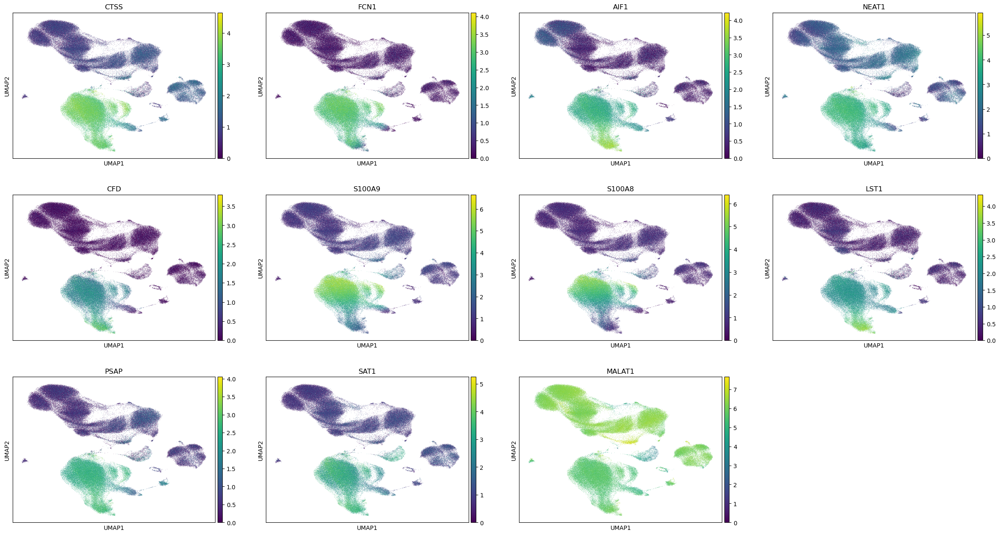

In [22]:
mono_canon = annot[(annot['Cluster']=='Mono') & (annot['Cell.Type']=='Monocyte')]['canonical.marker.overlap'].tolist()[0]
print(mono_canon)
sc.pl.umap(adata, color=mono_canon)

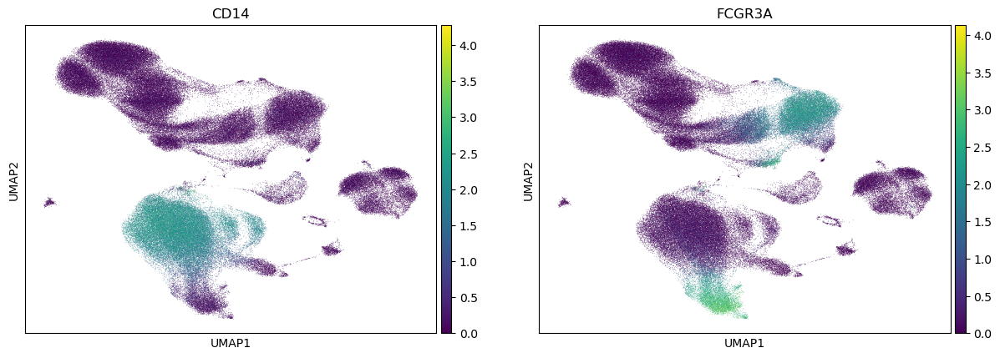

In [23]:
sc.pl.umap(adata, color=['CD14', 'FCGR3A'])
# FCGR3A is CD16

## NK

In [24]:
annot[annot['Cluster']=='NK']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,NK,Natural killer cell,2.700981e-69,9.525432e-67,7.212255e-08,15/150,22/223,"[KLRF1, GNLY, CD247, TYROBP, FCER1G, SPON2, IL...","[KLRF1, GNLY, CD247, TYROBP, FCER1G, SPON2, IL...","[KLRD1, TYROBP, S100A4, IL32, CLIC3, HOPX, SPO..."
2,NK,Mature NK T cell,1.740827e-64,2.017827e-66,4.718335e-03,12/42,15/141,"[KLRF1, GNLY, TYROBP, FCER1G, CD7, KLRD1, KLRB...","[GNLY, CD247, IL2RB, CD7, KLRD1, KLRB1, PRF1, ...","[KLRD1, TYROBP, MALAT1, CTSW, IL32, CLIC3, GZM..."
3,NK,"CD8-positive, alpha-beta cytotoxic T cell",1.624499e-31,4.479876e-33,5.815326e-03,6/54,17/175,"[GNLY, CD7, PRF1, NKG7, GZMB, VIM]","[KLRF1, GNLY, CD247, CD7, KLRD1, KLRB1, PRF1, ...","[KLRD1, MALAT1, CTSW, JAK1, B2M, IL32, GZMB, N..."
4,NK,Circulating natural killer cell,7.654231e-31,4.145225e-32,5.066548e-03,5/12,14/87,"[GNLY, TYROBP, KLRD1, NKG7, GZMB]","[KLRF1, GNLY, TYROBP, FCER1G, SPON2, IL2RB, CD...","[KLRD1, TYROBP, CTSW, CLIC3, GZMB, NKG7, HOPX,..."
5,NK,"Effector memory CD8-positive, alpha-beta T cel...",7.654231e-31,7.900333e-34,2.604273e-01,6/14,14/167,"[GNLY, KLRD1, PRF1, NKG7, GZMB, HOPX]","[KLRF1, GNLY, TYROBP, KLRD1, KLRB1, PRF1, NKG7...","[KLRD1, TYROBP, CTSW, TMSB4X, B2M, GZMB, HOPX,..."
6,NK,T cell,1.441891e-23,1.343641e-25,4.522613e-02,16/224,18/225,"[KLRF1, GNLY, CD247, IL2RB, CD7, KLRD1, KLRB1,...","[GNLY, CD247, IL2RB, CD7, KLRD1, KLRB1, PRF1, ...","[KLRD1, MALAT1, FTH1, FTL, CTSW, TMSB4X, S100A..."
7,NK,"Effector memory CD8-positive, alpha-beta T cell",1.418467e-15,2.187313e-17,4.610656e-02,6/47,12/78,"[GNLY, KLRD1, KLRB1, PRF1, NKG7, TMSB4X]","[GNLY, SPON2, KLRD1, PRF1, NKG7, CTSW, GZMB, C...","[KLRD1, CTSW, TMSB4X, S100A4, B2M, GZMB, NKG7,..."
8,NK,Macrophage,2.637976e-14,3.622125e-16,6.389452e-02,10/281,11/653,"[TYROBP, FCER1G, CD52, FTL, S100A6, S100A4, B2...","[GNLY, TYROBP, FCER1G, CD52, FTL, S100A6, S100...","[MT-ND2, TYROBP, FTH1, FTL, TMSB4X, S100A4, B2..."
9,NK,"CD16-negative, CD56-bright natural killer cell...",1.780604e-13,3.435773e-13,5.401134e-04,2/4,18/554,"[GNLY, NKG7]","[KLRF1, GNLY, CD247, FCER1G, SPON2, PRF1, CLIC...","[MT-ND2, MALAT1, TMSB4X, S100A4, B2M, CLIC3, G..."


['KLRF1', 'GNLY', 'CD247', 'TYROBP', 'FCER1G', 'SPON2', 'IL2RB', 'CD7', 'KLRD1', 'KLRB1', 'PRF1', 'NKG7', 'CTSW', 'GZMB', 'IL32']


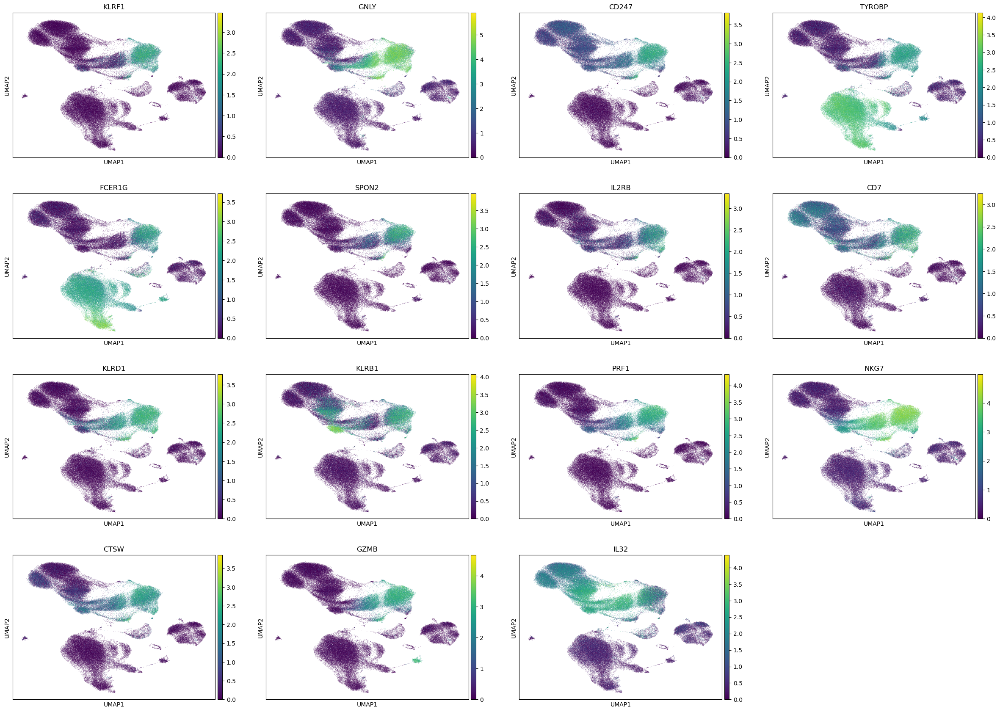

In [25]:
NK_canon = annot[(annot['Cluster']=='NK') & (annot['Cell.Type']=='Natural killer cell')]['canonical.marker.overlap'].tolist()[0]
print(NK_canon)
sc.pl.umap(adata, color=NK_canon)

## other

In [26]:
annot[annot['Cluster']=='other']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,other,Megakaryocyte,1.173395e-14,5.057736e-17,NaN,2/69,2/53,"[PPBP, NRGN]","[PPBP, NRGN]","[PPBP, NRGN]"


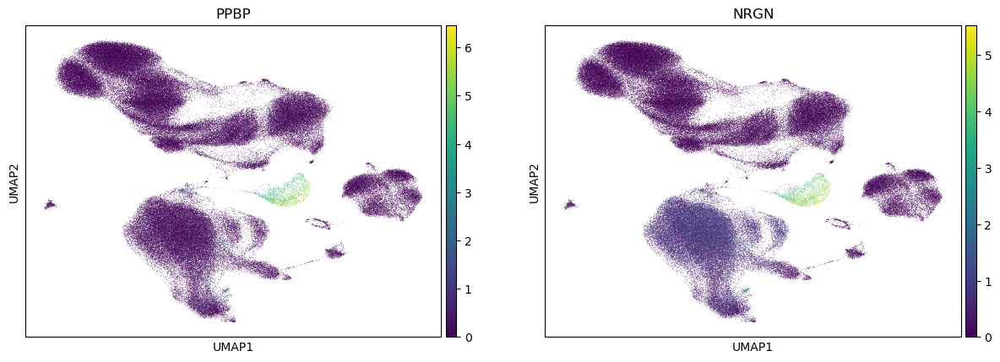

In [27]:
sc.pl.umap(adata, color=['PPBP', 'NRGN'])

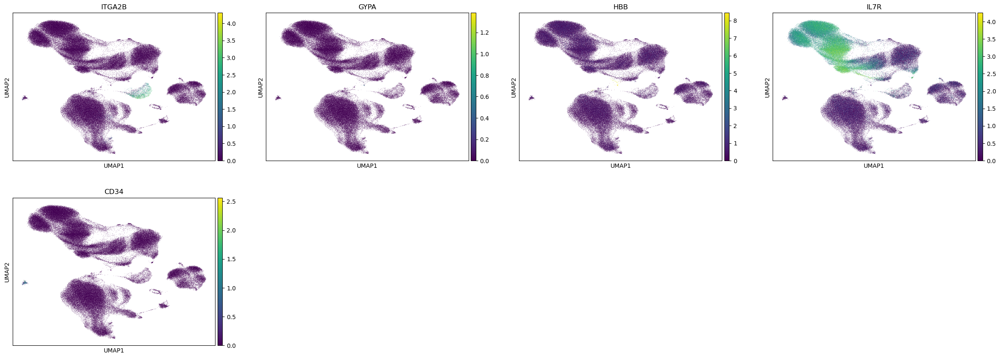

In [84]:
# Platelets marker: 'ITGA2B'
# Erythrocytes marker: 'GYPA', 'HBB'
# ILC marker: 'CD127' (IL7R)
# HSPC (Hematopoietic Stem and Progenitor Cells) marker: 'CD34'
sc.pl.umap(adata, color=['ITGA2B', 'GYPA', 'HBB', 'IL7R', 'CD34'])

## other_T

In [28]:
annot[annot['Cluster']=='other_T']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,other_T,Gamma-delta T cell,1.273452e-24,1.566185e-22,0.000004,4/35,24/308,"[TRDC, TRGC1, TRGC2, IL7R]","[TRDC, CD3D, CD3G, GZMK, TRGC1, TRGC2, KLRB1, ...","[KLRD1, NCR3, ZFP36L2, IL7R, CD3D, GZMK, SPOCK..."
2,other_T,T cell,1.273452e-24,5.127633e-26,0.016689,13/221,22/225,"[TRDC, GZMK, TRGC1, KLRB1, NCR3, IL7R, KLRG1, ...","[TRDC, CD3D, CD3G, GZMK, TRGC2, KLRB1, LYAR, I...","[KLRD1, NCR3, GZMK, IL32, SPOCK2, LTB, CXCR4, ..."
3,other_T,Mature NK T cell,8.066011e-24,4.086981e-25,0.020639,8/39,18/141,"[TRDC, TRGC1, TRGC2, KLRB1, NCR3, IL7R, IL32, ...","[TRDC, CD3D, CD3G, GZMK, KLRB1, NCR3, LYAR, IL...","[KLRD1, NCR3, IL7R, CD3D, IL32, GZMK, LYAR, SP..."
4,other_T,"Effector memory CD4-positive, alpha-beta T cell",1.241015e-22,1.056183e-23,NaN,4/26,0/1,"[GZMK, KLRB1, IL7R, CXCR4]",,"[CXCR4, IL7R, GZMK, KLRB1]"
5,other_T,"Effector memory CD8-positive, alpha-beta T cell",1.723928e-22,5.212718e-25,0.612903,6/44,5/78,"[GZMK, TRGC2, KLRB1, IL7R, CXCR4, KLRD1]","[GZMK, IL7R, S100A6, B2M, KLRD1]","[KLRD1, TRGC2, IL7R, S100A6, B2M, GZMK, CXCR4,..."
6,other_T,Helper T cell,8.212085e-17,2.810506e-16,0.000850,6/57,11/159,"[GZMK, KLRB1, IL7R, CXCR4, IL32, NEAT1]","[CD3D, CD3G, KLRB1, IL7R, CD3E, CXCR4, LTB, SY...","[IL7R, CD3D, GZMK, IL32, CXCR4, LTB, CD3G, SYN..."
7,other_T,Mucosal invariant T cell,1.177900e-14,1.102626e-14,0.004119,4/17,15/81,"[KLRB1, NCR3, IL7R, CXCR4]","[GZMK, TRGC1, KLRB1, NCR3, LYAR, PHACTR2, IL7R...","[NCR3, ZFP36L2, IL7R, GZMK, LYAR, SPOCK2, CXCR..."
8,other_T,"CD4-positive, alpha-beta T cell",2.938219e-14,5.303208e-13,0.000251,5/93,17/281,"[GZMK, KLRB1, IL7R, KLRG1, LTB]","[CD3D, CD3G, GZMK, KLRB1, IL7R, CD3E, DUSP2, M...","[ZFP36L2, IL7R, CD3D, PPP2R5C, GZMK, SPOCK2, I..."
9,other_T,"Central memory CD4-positive, alpha-beta T cell",6.086150e-13,1.165433e-13,NaN,5/25,0/1,"[IL7R, ZFP36L2, LTB, IL32, TMSB10]",,"[TMSB10, IL32, LTB, ZFP36L2, IL7R]"


In [29]:
adata.obs[adata.obs['celltype.l1']=='other_T']['celltype.l2'].unique()

['MAIT', 'gdT', 'dnT']
Categories (31, object): ['ASDC', 'B intermediate', 'B memory', 'B naive', ..., 'cDC2', 'dnT', 'gdT', 'pDC']

['TRDC', 'TRGC1', 'TRGC2', 'IL7R']


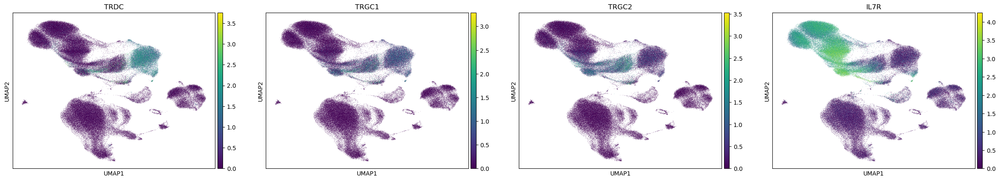

In [30]:
other_T = annot[(annot['Cluster']=='other_T') & (annot['Cell.Type']=='Gamma-delta T cell')]['canonical.marker.overlap'].tolist()[0]
print(other_T)
sc.pl.umap(adata, color=other_T)

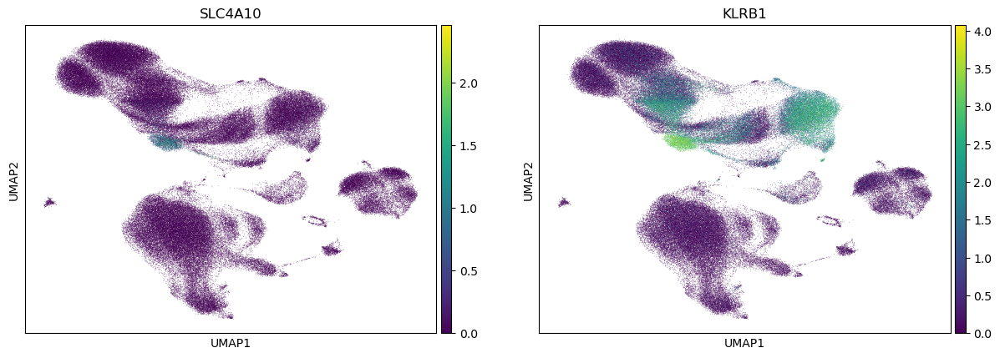

In [90]:
# MAIT markers: SLC4A10, KLRB1, TRAV1-2, CD3D, CD3E, CD3G, CD8A, CXCR4, MAF, ZBTB16
# gdT markers: CD3D, CD3E, TRDC, TRDV2, TRGV9, CD8A, CD8B, TRGC1, TRGC2
mait = ['SLC4A10', 'KLRB1']
# gdt = ['CD3D', 'CD3E', 'TRDC', 'TRDV2', 'TRGV9', 'CD8A', 'CD8B', 'TRGC1', 'TRGC2']
sc.pl.umap(adata, color=mait)